# XTCAV Processor Class

Let's make a new class for XTCAV data processing that collects some of the old code.
- Currently the xtcav and xtcav2 repositories are fairly different.  I've cloned xtcav2 from github, copied xtcav(1) from its source code on s3df at `/sdf/group/lcls/ds/ana/sw/conda1/inst/envs/ana-4.0.66-py3/lib/python3.9/site-packages/xtcav` (see `xtcav.__file__`), and pasted the utils code I wrote that uses xtcav(1) objects.
- The goal here is to begin to synthesize and simplify.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import psana

In [2]:
from utils import (
    show_xtcav_firstpulse,
    show_xtcav_firstpulse_zoomin_grid
)
from xtcav.ShotToShotCharacterization import ShotToShotCharacterization

## Set up & find sources

In [3]:
runnum = 11    # First single pulse run

dataSource=psana.DataSource("exp=cxil1037623:run=%d:idx"%runnum)

In [4]:
XTCAVRetrieval=ShotToShotCharacterization();
XTCAVRetrieval.SetEnv(dataSource.env())

In [5]:
import xtcav
print(xtcav.__file__)

/sdf/group/lcls/ds/ana/sw/conda1/inst/envs/ana-4.0.66-py3/lib/python3.9/site-packages/xtcav/__init__.py


In [6]:
dataSource

<psana._DataSource(@0x7fb2ef01a670)>

In [7]:
type(dataSource)

psana._DataSource

In [8]:
# why do these fail?
# how can I typecheck psana objects like DataSource?

try:
    isinstance(dataSource, psana.DataSource)
except TypeError:
    print("TypeCheck fail: psana.DataSouce does not appear to be a valid type")
try:
    psana._DataSource
except:
    print("TypeCheck fail: psana._DataSouce does not appear to be a valid attribute")

TypeCheck fail: psana.DataSouce does not appear to be a valid type
TypeCheck fail: psana._DataSouce does not appear to be a valid attribute


## Old code sources

In [9]:
# This is my current utils method:

def load_xtcav_run_first_pulse(runnum):
    """
    Load the first recorded XTCAV pulse from a data run.

    Parameters
    ----------
    runnum : integer
        The run number

    Return
    ------
    (ar,bool) : the image array, and a success/failure flag
    """
    # data source
    dataSource=psana.DataSource("exp=cxil1037623:run=%d:idx"%runnum)

    # XTCAV data shot-by-shot retrieval object
    XTCAVRetrieval=ShotToShotCharacterization();
    XTCAVRetrieval.SetEnv(dataSource.env())

    # get the run and shot timing data
    run = next(dataSource.runs())
    times = run.times()

    # find the first event with XTCAV data
    t_idx = 0
    success = False
    while not success and t_idx<1000:
        t = times[t_idx]
        evt = run.event(t)
        success = XTCAVRetrieval.SetCurrentEvent(evt)
        #print(f"t={t_idx}: success = {success}")
        t_idx += 1

    # get the XTCAV camera raw image data
    image,flag=XTCAVRetrieval.RawXTCAVImage()

    # return
    return image,flag

In [10]:
# Here's (some snippets of) the xtvac(1) class used:
# (Only methods used above are shown!)

class ShotToShotCharacterization(object):

    """
    Class that can be used to reconstruct the full X-Ray power time profile for single or multiple bunches, relying on the presence of a dark background reference, and a lasing off reference. (See GenerateDarkBackground and Generate LasingOffReference for more information)
    Attributes:
        calibrationpath (str): Custom calibration directory in case the default is not intended to be used.
        medianfilter (int): Number of neighbours for median filter (If not set, the value that was used for the lasing off reference will be used).
        snrfilter (float): Number of sigmas for the noise threshold (If not set, the value that was used for the lasing off reference will be used).
        roiwaistthres (float): ratio with respect to the maximum to decide on the waist of the XTCAV trace (If not set, the value that was used for the lasing off reference will be used).
        roiexpand (float): number of waists that the region of interest around will span around the center of the trace (If not set, the value that was used for the lasing off reference will be used).
        islandsplitmethod (str): island splitting algorithm. Set to 'scipylabel' or 'contourLabel'  The defaults parameter is then one used for the lasing off reference or 'scipylabel'.
    """

    def __init__(self):

        #Handle warnings
        warnings.filterwarnings('always',module='Utils',category=UserWarning)
        warnings.filterwarnings('ignore',module='Utils',category=RuntimeWarning, message="invalid value encountered in divide")

        #Some default values for the options
        self._experiment='amoc8114'     #Experiment label
        self._darkreferencepath=[];         #Dark reference information
        self._lasingoffreferencepath=[];         #Dark reference information
        self._darkreference=[]
        self._lasingoffreference=[]
        self._nb=float('nan')                    #Number of bunches
        self._medianfilter=float('nan')          #Number of neighbours for median filter
        self._snrfilter=float('nan')             #Number of sigmas for the noise threshold
        self._roiwaistthres=float('nan')         #Parameter for the roi location
        self._roiexpand=float('nan')             #Parameter for the roi location
        self._islandsplitmethod=''               #Method for island splitting
        self._islandsplitpar1=float('nan')
        self._islandsplitpar2=float('nan')
        self._currentevent=[]
        self._eventresultsstep1=[]
        self._eventresultsstep2=[]
        self._eventresultsstep3=[]
        self._env=[]
        self._globalcalibration=[]
        self._roixtcav=[]
        self._calpath=''

        #Different flags
        self._loadeddarkreference=False
        self._loadedlasingoffreference=False
        self._currenteventavailable=False
        self._currenteventprocessedstep1=False   #Step one is pure processing of the trace, without lasing off referencing
        self._currenteventprocessedstep2=False   #Step two is calculating physical units
        self._currenteventprocessedstep3=False   #Step three is the processing of the profiles with respect to the reference
        self._envinfo=False

        #Camera and type for the xtcav images
        self.xtcav_camera = psana.Source('DetInfo(XrayTransportDiagnostic.0:Opal1000.0)')
        self.xtcav_type=psana.Camera.FrameV1
        self._rawimage=[]

        #Ebeam type: it should actually be the version 5 which is the one that contains xtcav stuff
        self.ebeam_data=psana.Source('BldInfo(EBeam)')
        self._ebeam=[]

        #Gas detectors for the pulse energies
        self.gasdetector_data=psana.Source('BldInfo(FEEGasDetEnergy)')
        self._gasdetector=[]

    def SetEnv(self,env):
        """
        After creating an instance of the ShotToShotCharacterization class, it is necessary to pass the env object for that data that is being analysed.

        Args:
            env (Env object): Env object that is going to be used for the analysis.
            
        """
        self._env=env
        self._envinfo=False


    def SetCurrentEvent(self,evt):
        """
        Method that sets a psana event to be the current event. Only after setting an event it is possible to query for results such as X-Ray power, or pulse delay. On the other hand, the calculations to get the reconstruction will not be done until the information itself is requested, so the call to this method should be quite fast.

        Args:
            evt (psana event): relevant event to retrieve information form
            
        Returns:
            True: All the input form detectors necessary for a good reconstruction are present in the event. 
            False: The information from some detectors is missing for that event. It may still be possible to get information.
        """
        ebeam = evt.get(psana.Bld.BldDataEBeamV7,self.ebeam_data)
        if not ebeam:
            ebeam = evt.get(psana.Bld.BldDataEBeamV6,self.ebeam_data)
        if not ebeam:
            ebeam = evt.get(psana.Bld.BldDataEBeamV5,self.ebeam_data)
        gasdetector=evt.get(psana.Bld.BldDataFEEGasDetEnergy,self.gasdetector_data)
        if not gasdetector:
            gasdetector=evt.get(psana.Bld.BldDataFEEGasDetEnergyV1,self.gasdetector_data)
        frame = evt.get(self.xtcav_type, self.xtcav_camera)

        self._currenteventprocessedstep1=False
        self._currenteventprocessedstep2=False
        self._currenteventprocessedstep3=False
        self._eventresultsstep1=[]
        self._eventresultsstep2=[]
        self._eventresultsstep3=[]


        # If there is not frame, there is nothing we can do
        if (not frame):
            self._currenteventavailable=False
            return False

        self._rawimage=frame.data16().astype(np.float64)
        self._currentevent=evt
        self._ebeam=ebeam
        self._gasdetector=gasdetector
        self._currenteventavailable=True
        # If gas detector or ebeam info is missing, we sill still may be able to do some stuff, but still return False
        if (ebeam and gasdetector):
            return True
        else:
            return False

    def RawXTCAVImage(self):
        """
        Method which returns the raw XTCAV image. This does not require of references at all.

        Returns: 
            out1: 2D array with the image
            out2: True if the retrieval was successful, False otherwise.
        """
        if not self._currenteventavailable:
            return [],False

        return self._rawimage,True

## Sandbox

### Get data source, get run, get shot times, get events

#### Runs - get info...

In [11]:
# get the run and shot timing data
run = next(dataSource.runs())
times = run.times()

In [12]:
dataSource.runs

<function _DataSource.runs>

In [13]:
dataSource=psana.DataSource("exp=cxil1037623:run=%d:idx"%runnum)

In [14]:
runs = []
for i,run in enumerate(dataSource.runs()):
    print(f"{i}:    {run}")
    runs.append(run)

0:    <psana.Run(@0x7fb2eee4cb70)>


In [15]:
runs

[<psana.Run(@0x7fb2eee4cb70)>]

In [16]:
isinstance(runs[0],psana.Run)

True

#### ...runs info & questions -

- There is only 1 run
  - **Is this standard?**
- Runs are a list of psana.Run instances
  - type checking works normally here

In [17]:
dataSource=psana.DataSource("exp=cxil1037623:run=%d:idx"%runnum)
run = next(dataSource.runs())

print(run)

<psana.Run(@0x7fb30543e7e0)>


#### Times - get info...

In [18]:
times = run.times()
print(len(times))
print(times[0],times[-1])

41024
<psana.EventTime(@0x7fb2ee784570)> <psana.EventTime(@0x7fb2ee64a030)>


In [19]:
times[:5]

(<psana.EventTime(@0x7fb2ee784570)>,
 <psana.EventTime(@0x7fb2ee784830)>,
 <psana.EventTime(@0x7fb2ee784770)>,
 <psana.EventTime(@0x7fb2ee784650)>,
 <psana.EventTime(@0x7fb2ee784550)>)

In [20]:
times[0]

<psana.EventTime(@0x7fb2ee784570)>

In [21]:
assert(isinstance(times[0],psana.EventTime))

In [22]:
for i in range(3):
    print(times[i].seconds())
print()
for i in range(3):
    print(times[i].nanoseconds())

1740484363
1740484363
1740484363

486178405
494542256
502878571


In [23]:
for i in range(3):
    print(times[i].time())
print()
for i in range(3):
    print(times[i].fiducial())

7475323418770570853
7475323418778934704
7475323418787271019

26604
26607
26610


#### ...times - info & questions

- run.times() returns a tuple of psana EventTime instances
  - EventTime instances have .time(), .seconds, .nanoseconds, and .fiducials methods
  - **What is the .fiducials method returning?**
  - len(run.times()) is the number of shots in the run **(pls confirm - yes????)**

In [24]:
run.event?

Docstring:
self.event() -> array

Returns a randomly accessed event using timestamp argument
Type:      builtin_function_or_method

#### Events - get info...

In [25]:
print(run.event(times[0]))
print(run.event(times[1]))
print(run.event(times[2]))
print(run.event(times[3]))

psana.Event()
psana.Event()
psana.Event()
psana.Event()


In [26]:
evt = run.event(times[0])
evt

psana.Event()

In [27]:
assert(isinstance(run.event(times[0]),psana.Event))

In [28]:
evt.keys()

[EventKey(type=psana.EvrData.DataV4, src='DetInfo(NoDetector.0:Evr.1)', alias='evr1'),
 EventKey(type=psana.Generic1D.DataV0, src='DetInfo(CxiDs1.0:Wave8.0)', alias='CXI-DG2-BMMON-WF'),
 EventKey(type=psana.Jungfrau.ElementV2, src='DetInfo(CxiDs1.0:Jungfrau.0)', alias='jungfrau4M'),
 EventKey(type=psana.Bld.BldDataEBeamV7, src='BldInfo(EBeam)'),
 EventKey(type=psana.Bld.BldDataFEEGasDetEnergyV1, src='BldInfo(FEEGasDetEnergy)'),
 EventKey(type=psana.Bld.BldDataSpectrometerV1, src='BldInfo(FEE-SPEC0)'),
 EventKey(type=psana.Bld.BldDataBeamMonitorV1, src='BldInfo(HX2-SB1-BMMON)'),
 EventKey(type=psana.Bld.BldDataBeamMonitorV1, src='BldInfo(HFX-DG2-BMMON)'),
 EventKey(type=psana.Bld.BldDataBeamMonitorV1, src='BldInfo(CXI-DG2-BMMON)'),
 EventKey(type=psana.EventOffset),
 EventKey(type=psana.EventId),
 EventKey(type=None),
 EventKey(type=psana.DgramList)]

In [29]:
evt.get?

Docstring:
self.get(...) -> object

Finds and retrieves objects from event. This is an overloaded method which can accept variable number of parameters:
 * ``get(type, src, key:string)``
 * ``get(type, src)`` - equivalent to ``get(type, src, "")``
 * ``get(type, key:string)`` - equivalent to ``get(type, Source(None), key)``
 * ``get(type)`` - equivalent to ``get(type, Source(None), "")``

pyana compatibility methods (deprecated):
 * ``get(string)`` - gets any Python object stored with ``put(object, string)``
 * ``get(int, addr:Source)`` - equivalent to ``get(type, addr, "")`` where type is deduced from integer assumed to be ``Pds::TypeId::Type`` value
 * ``get(int, addr:string)`` - equivalent to ``get(type, Source(addr), "")`` where type is deduced from integer assumed to be ``Pds::TypeId::Type`` value
 * ``get(int)`` - equivalent to ``get(int, "")``

In the first four methods type argument can be a type object or a list of type objects. If the list is given then object is returned who

In [30]:
# The .get method seems somewhat brittle
# Guessing it's more robust when passed event IDs?

#evt.get(psana.EvrData.DataV4, 'DetInfo(NoDetector.0:Evr.1)', 'evr1')
#evt.get(evt.keys()[0])

src=psana.Source('NoDetector.0:Evr.1')
#x = evt.get(psana.EvrData.DataV4, src, 'evr1')
x = evt.get(psana.EvrData.DataV4, src, '')

print(x)

#### ...events info & questions

- For some `Run` object `run`, events are returned by passing `run.event()` a EventTime instance
- Passing it anything else returns None
- events are psana.Event instances

### Get req'd data sources, get event data

In [31]:
# Code from `SetCurrentEvent`

# ebeam = evt.get(psana.Bld.BldDataEBeamV7,self.ebeam_data)
# if not ebeam:
#     ebeam = evt.get(psana.Bld.BldDataEBeamV6,self.ebeam_data)
# if not ebeam:
#     ebeam = evt.get(psana.Bld.BldDataEBeamV5,self.ebeam_data)
# gasdetector=evt.get(psana.Bld.BldDataFEEGasDetEnergy,self.gasdetector_data)
# if not gasdetector:
#     gasdetector=evt.get(psana.Bld.BldDataFEEGasDetEnergyV1,self.gasdetector_data)
# frame = evt.get(self.xtcav_type, self.xtcav_camera)

# self._currenteventprocessedstep1=False
# self._currenteventprocessedstep2=False
# self._currenteventprocessedstep3=False
# self._eventresultsstep1=[]
# self._eventresultsstep2=[]
# self._eventresultsstep3=[]


# # If there is not frame, there is nothing we can do
# if (not frame):
#     self._currenteventavailable=False
#     return False

# self._rawimage=frame.data16().astype(np.float64)
# self._currentevent=evt
# self._ebeam=ebeam
# self._gasdetector=gasdetector
# self._currenteventavailable=True
# # If gas detector or ebeam info is missing, we sill still may be able to do some stuff, but still return False
# if (ebeam and gasdetector):
#     return True
# else:
#     return False

#### electron beam

In [32]:
ebeam_data=psana.Source('BldInfo(EBeam)')

ebeam_data

Source("BldInfo(EBeam)")

In [33]:
ebeam_data.srcMatch?

Docstring:
self.srcMatch([aliases:AliasMap]) -> :py:class:`SrcMatch`

Returns object which can be used to match Src instances. If Source instance was constructed from a string then this method tries to resolve string as an alias. If alias is not found then it tries to parse the string according to the definitions above. If parsing fails then exception is thrown.
Optional argument provides alias map instance which can be obtained from environment object (:py:class:`Env`). If alias map is not provided then alias names are not resolved (aliases cannot be used in this case).
Type:      builtin_function_or_method

In [34]:
psana.Bld.BldDataEBeamV7?

Docstring:     
BldDataEBeamV7 is the same as BldDataEBeamV6.
A sign-error error was discovered in the calculation of the photon energy that goes into the ebeam bld.
This is fixed on the accelerator side, but we will increment the ebeam bld version number to V7 so the
data is clearly marked as changed.
Init docstring:
Raises an exception
This class cannot be instantiated from Python
Type:           class
Subclasses:     

In [35]:
ebeam = evt.get(psana.Bld.BldDataEBeamV7,ebeam_data)

ebeam

In [36]:
print(ebeam.Version)
print(ebeam.TypeId)
print(ebeam.ebeamXTCAVAmpl())
print(ebeam.ebeamXTCAVPhase())
print(ebeam.ebeamPhotonEnergy())
print(ebeam.ebeamCharge())
print(ebeam.damageMask())

7
15
0.0
0.0
9696.187885330262
0.2538268676352
49212


In [37]:
if not ebeam:
    print(0)
else:
    print(1)

1


#### Gas Detector

In [38]:
psana.Bld.BldDataFEEGasDetEnergy

psana.Bld.BldDataFEEGasDetEnergy

In [39]:
gasdetector_data=psana.Source('BldInfo(FEEGasDetEnergy)')
gasdetector=evt.get(psana.Bld.BldDataFEEGasDetEnergy,gasdetector_data)

print(gasdetector_data)
print(gasdetector)

Source("BldInfo(FEEGasDetEnergy)")
None


#### Frame

In [40]:
#frame = evt.get(self.xtcav_type, self.xtcav_camera)

In [41]:
xtcav_camera = psana.Source('DetInfo(XrayTransportDiagnostic.0:Opal1000.0)')

print(xtcav_camera)

Source("DetInfo(XrayTransportDiagnostic.0:Opal1000.0)")


In [42]:
xtcav_type=psana.Camera.FrameV1

print(psana.Camera.FrameV1)

<class 'psana.Camera.FrameV1'>


In [43]:
print(psana.Camera.FrameV1.Version)
# print(psana.Camera.FrameV1.data16())
# print(psana.Camera.FrameV1.data8)
# print(psana.Camera.FrameV1.depth)
# print(psana.Camera.FrameV1.depth_bytes)
# print(psana.Camera.FrameV1.height)
# print(psana.Camera.FrameV1.width)
# print(psana.Camera.FrameV1.mro)
# print(psana.Camera.FrameV1.offset)
print(psana.Camera.FrameV1.TypeId)

1
2


In [44]:
frame = evt.get(xtcav_type, xtcav_camera)

print(frame)

None


In [45]:
from tqdm import tqdm

In [46]:
#### Loop & search for frames

# (Slow the first time,)
# (fast thereafter)

N_shots = len(times)
times_ebeam = []
times_gasdetector = []
times_frames = []
times_ebeamAndGas = []
times_ebeamAndFrame = []
times_gasAndFrame = []
times_all = []

for i,t in enumerate(tqdm(times,desc="Indexing shots...")):
    evt = run.event(t)
    ebeam = evt.get(psana.Bld.BldDataEBeamV7,ebeam_data)
    #gasdetector=evt.get(psana.Bld.BldDataFEEGasDetEnergy,gasdetector_data)
    gasdetector=evt.get(psana.Bld.BldDataFEEGasDetEnergyV1,gasdetector_data)
    frame = evt.get(xtcav_type, xtcav_camera)
    if ebeam:
        times_ebeam.append(i)
    if gasdetector:
        times_gasdetector.append(i)
    if frame:
        times_frames.append(i)
    if ebeam and gasdetector and not frame:
        times_ebeamAndGas.append(i)
    elif ebeam and frame and not gasdetector:
        times_ebeamAndFrame.append(i)
    elif gasdetector and times_ebeamAndFrame and not ebeam:
        times_gasAndFrame.append(i)
    elif ebeam and gasdetector and frame:
        times_all.append(i)

print(f"Found {len(times_ebeam)} shots with ebeam data")
print(f"Found {len(times_gasdetector)} shots with gasdetector data")
print(f"Found {len(times_frames)} shots with frame data")
print()
print(f"Found {len(times_ebeamAndGas)} shots with ebeam+gas+NOT(frame) data")
print(f"Found {len(times_ebeamAndFrame)} shots with ebeam+frame+NOT(gas) data")
print(f"Found {len(times_gasAndFrame)} shots with gas+frame+NOT(ebeam) data")
print()
print(f"Found {len(times_all)} shots with all 3")

Indexing shots...:   6%|▋         | 2564/41024 [00:06<01:36, 397.66it/s]


KeyboardInterrupt: 

In [47]:
evt = run.event(times[times_gasdetector[0]])
gasdetector=evt.get(psana.Bld.BldDataFEEGasDetEnergyV1,gasdetector_data)
gasdetector

In [48]:
# # find the first event with XTCAV data
# t_idx = 0
# success = False
# while not success and t_idx<1000:
#     t = times[t_idx]
#     evt = run.event(t)
#     success = XTCAVRetrieval.SetCurrentEvent(evt)
#     #print(f"t={t_idx}: success = {success}")
#     t_idx += 1

# # get the XTCAV camera raw image data
# image,flag=XTCAVRetrieval.RawXTCAVImage()

In [49]:
evt = run.event(times[times_frames[0]])
frame = evt.get(xtcav_type, xtcav_camera)

print(frame)

In [50]:
frame.data16()

array([[69, 12, 10, ..., 13, 14,  3],
       [14, 20, 17, ..., 46, 14, 20],
       [26,  9, 16, ..., 47, 10, 24],
       ...,
       [10, 16,  9, ..., 24, 51, 34],
       [30, 27,  8, ..., 20, 68, 21],
       [18, 17, 10, ..., 21, 60, 10]], dtype=uint16)

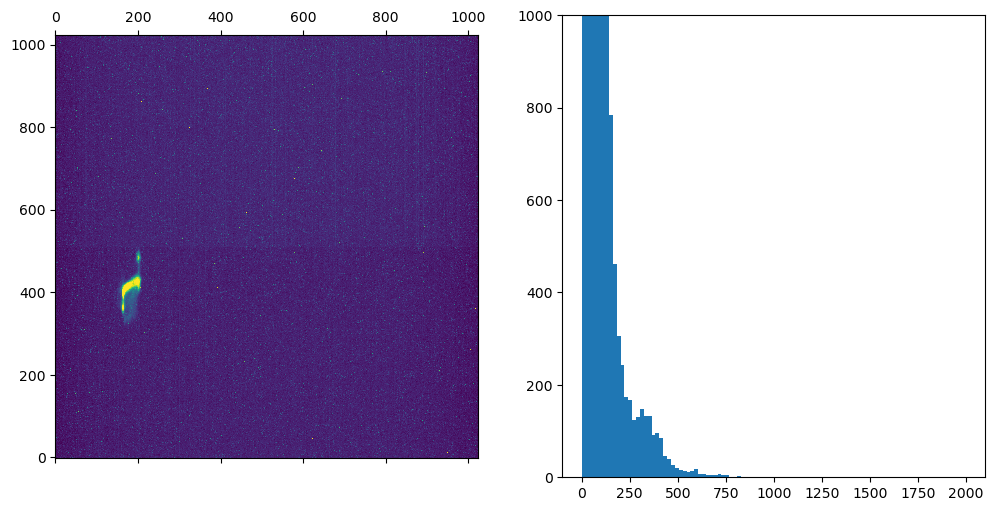

In [51]:
im = frame.data16()

fig,(ax1,ax2) = plt.subplots(1,2,figsize=(12,6))
ax1.matshow(im, vmin=0,vmax=350)
ax1.invert_yaxis()
ax2.hist(im.ravel(),bins=np.linspace(0,2000,100))
ax2.set_ylim(0,1000)
plt.show()

In [52]:
from utils import get_com_clean, get_plot_lims, get_xtcav_mask

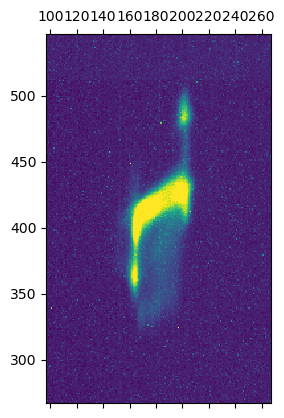

In [53]:
# Zoom in

# set zoom FOV
fovs = Lx,Ly = 170,280

# get CoM
com = get_com_clean(im)

# show
fig,ax = plt.subplots()
ax.matshow(im,vmin=0,vmax=350)
ax.set_xlim(get_plot_lims(com[1],Lx))
ax.set_ylim(get_plot_lims(com[0],Ly))
ax.set_aspect('equal')
plt.show()

#### Can we extract info from evr detectors?

In [54]:
# learning which detectors are in this experiment/run
detNames = psana.DetNames()
print('*** Detector Names (Full-Name, DAQ-Alias, User-Alias) ***')
for detname in detNames: print(detname)
 
epicsNames = psana.DetNames('epics')
print('*** Some Epics Names (Full-Name, DAQ-Alias, User-Alias) ***')
for ename in epicsNames[:4]: print(ename) # only print a few

*** Detector Names (Full-Name, DAQ-Alias, User-Alias) ***
('XrayTransportDiagnostic.0:Opal1000.0', 'xtcav', '')
('NoDetector.0:Evr.1', 'evr1', '')
('NoDetector.0:Evr.2', 'evr2', '')
('EBeam', '', '')
('FEEGasDetEnergy', '', '')
('FEE-SPEC0', '', '')
('HX2-SB1-BMMON', '', '')
('HFX-DG2-BMMON', '', '')
('CXI-DG2-BMMON', '', '')
('CxiDs1.0:Wave8.0', 'CXI-DG2-BMMON-WF', '')
('CxiDs1.0:Jungfrau.0', 'jungfrau4M', '')
('ControlData', '', '')
*** Some Epics Names (Full-Name, DAQ-Alias, User-Alias) ***
('AT1L0:SOLID:MPA:01:POS_STATE_RBV', 'at1l0_SolidAttenuator_1_1500pm_diam', '')
('AT1L0:SOLID:MPA:02:POS_STATE_RBV', 'at1l0_SolidAttenuator_2_13um_diam', '')
('AT1L0:SOLID:MPA:03:POS_STATE_RBV', 'at1l0_SolidAttenuator_3_62um_diam', '')
('AT1L0:SOLID:MPA:04:POS_STATE_RBV', 'at1l0_SolidAttenuator_4_60um_diam', '')


In [55]:
# From chris vam's workshop (https://confluence.slac.stanford.edu/download/attachments/94179911/video1502222460.mp4?version=1&modificationDate=1671155568000&api=v2)

#evr = psana.Detector('evr0')  # --> timing system information, e.g. was there xray beam in this event? did a laser fire?

# will the other two evr detectors have this info? where do we find what they are?
evr1 = psana.Detector('evr1') 
evr2 = psana.Detector('evr2') 

In [56]:
#### Loop

times_evr1 = []
times_evr2 = []

for i,t in enumerate(tqdm(times,desc="Indexing shots...")):
    evt = run.event(t)
    code_evr1 = evr1.eventCodes(evt)
    code_evr2 = evr2.eventCodes(evt)
    if code_evr1:
        times_evr1.append(i)
    if code_evr2:
        times_evr2.append(i)

print(f"Found {len(times_evr1)} shots with evr1 data")
print(f"Found {len(times_evr2)} shots with evr2 data")

Indexing shots...:   6%|▋         | 2570/41024 [00:04<01:14, 514.73it/s]


KeyboardInterrupt: 

In [57]:
evr1 = psana.Detector('evr1') 

for i in range(10):
    evt = run.event(times[i])
    codes_evr1 = evr1.eventCodes(evt)
    print(codes_evr1)

[137, 140, 141, 142, 143, 41, 42, 43, 162, 40]
[137, 140, 162, 40]
[137, 140, 141, 41, 162, 40]
[137, 140, 162, 40]
[137, 140, 141, 142, 41, 42, 162, 40]
[137, 140, 162, 40]
[137, 140, 141, 41, 162, 40]
[137, 140, 162, 40]
[137, 140, 141, 142, 41, 42, 162, 40]
[137, 140, 162, 40]


# New Class

In [136]:
# *********** NEW CLASS ***************
#
# Define a new class for xtcav processing
# Start with retrieval methods...

class XTCAVProcessor(object):
    """ New class for processing XTCAV data 
    (Ben Savitzky, 6/2025)
    """
    def __init__(self, dataSource, env=None, preindex=False, iteration='good', verbose=True):
        """
        Parameters
        ----------
        ds : a psana DataSource instance
        env : None or a psana env; if None uses dataSouce.env()
        preindex : bool
            Toggles indexing events on instantiation
        iteration : string in ('all', 'good', 'frame'):
            Determines which data is traversed when calling the shot iterator.
            'all' iterates over all shots. 'good' iterates over shots with all data
            present.  'frame' iterates over all data with XTCAV camera data present.
        verbose : bool
        """
        self.ds = dataSource
        self._set_env(env)
        self._set_run()
        self._set_ebeam_data()
        self._set_gasdetector_data()
        self._set_xtcav_camera()
        self._set_data_source_types(verbose=verbose)
        self._set_iteration_type(iteration)
        if preindex:
            self._preindex_shots(verbose=verbose)
            self.reset_shot_iterator()
        else:
            self._data_is_indexed = False
            self.reset_shot_iterator()
        pass

    def _set_env(self, env):
        if env is None:
            self._env = self.ds.env()
        else:
            self._env = env
        pass

    def _set_run(self):
        """ Assumes dataSource has a single run
        """
        self._run = next(dataSource.runs())
        self._times = self._run.times()

    @property
    def N_shots(self):
        """ Number of shots """
        return len(self._times)
    
    def _set_ebeam_data(self):
        #Ebeam type: it should actually be the version 5 which is the one that contains xtcav stuff
        self.ebeam_data=psana.Source('BldInfo(EBeam)')
        self._ebeam=None
        pass

    def _set_gasdetector_data(self):
        #Gas detectors for the pulse energies
        self.gasdetector_data=psana.Source('BldInfo(FEEGasDetEnergy)')
        self._gasdetector=None
        pass

    def _set_xtcav_camera(self):
        #Camera and type for the xtcav images
        self.xtcav_camera = psana.Source('DetInfo(XrayTransportDiagnostic.0:Opal1000.0)')
        self.xtcav_type=psana.Camera.FrameV1
        self._rawimage=None
        pass

    def _set_data_source_types(self, verbose=True):
        """ 
        Determine the source types and set according getter methods for
        ebeam and gas detector data
        """
        self._get_ebeam = None
        self._get_gasdetector = None
        for i,t in enumerate(tqdm(self._times,desc="Setting data source types...")):
            # set event
            evt = self._run.event(t)
            # set ebeam getter
            if self._get_ebeam is None:
                ebeam = evt.get(psana.Bld.BldDataEBeamV7,self.ebeam_data)
                if ebeam:
                    self.ebeam_type = psana.Bld.BldDataEBeamV7
                    self._get_ebeam = lambda event: event.get(psana.Bld.BldDataEBeamV7,self.ebeam_data)
                else:
                    ebeam = evt.get(psana.Bld.BldDataEBeamV6,self.ebeam_data)
                    if ebeam:
                        self.ebeam_type = psana.Bld.BldDataEBeamV6
                        self._get_ebeam = lambda event: event.get(psana.Bld.BldDataEBeamV6,self.ebeam_data)
                    else:
                        ebeam = evt.get(psana.Bld.BldDataEBeamV5,self.ebeam_data)
                        if ebeam:
                            self.ebeam_type = psana.Bld.BldDataEBeamV5
                            self._get_ebeam = lambda event: event.get(psana.Bld.BldDataEBeamV5,self.ebeam_data)
            # set gas detector getter
            if self._get_gasdetector is None:
                gasdetector=evt.get(psana.Bld.BldDataFEEGasDetEnergy,self.gasdetector_data)
                if gasdetector:
                    self.gasdetector_type = psana.Bld.BldDataFEEGasDetEnergy
                    self._get_gasdetector = lambda event: event.get(psana.Bld.BldDataFEEGasDetEnergy,self.gasdetector_data)
                else:
                    gasdetector=evt.get(psana.Bld.BldDataFEEGasDetEnergyV1,self.gasdetector_data)         
                    if gasdetector:
                        self.gasdetector_type = psana.Bld.BldDataFEEGasDetEnergyV1
                        self._get_gasdetector = lambda event: event.get(psana.Bld.BldDataFEEGasDetEnergyV1,self.gasdetector_data)
            # if we have both getters, break and return
            if self._get_ebeam is not None and self._get_gasdetector is not None:
                break
        if verbose:
            print("Data source types successfully set.")
            print(f"Electron beam source type is {self.ebeam_type}")
            print(f"Gas detector source type is {self.gasdetector_type}")
        pass       

    def _get_frame(self,evt):
        return evt.get(self.xtcav_type, self.xtcav_camera)
    
    def get_data(self, evt):
        """
        Parameters
        ----------
        evt : psana.Event

        Returns
        -------
        (ebeam, gasdetector, frame) : (
            psana.Bld.BldDataEBeamVX or None,
            psana.Bld.BldDataFEEGasDetEnergyV1 or None,
            psana.Camera.FrameV1 or None,
        )
        """
        ebeam = self._get_ebeam(evt)
        gasdetector = self._get_gasdetector(evt)
        frame = self._get_frame(evt)
        return ebeam, gasdetector, frame

    def _setup_indexing(self):
        """ Setup event indexing containers 
        """
        self.data_is_indexed = False
        
        # setup containers
        self._times_ebeam = []
        self._times_gasdetector = []
        self._times_frames = []
        self._times_ebeamAndGas = []
        self._times_ebeamAndFrame = []
        self._times_gasAndFrame = []
        self._times_ebeam_only = []
        self._times_gas_only = []
        self._times_frame_only = []
        self._times_all = []
        self._times_none = []
    
    def _preindex_shots(self, verbose=True):
        """ Loop through and index (which shots received data from which cameras
        i.e. ebeam detector, gas detector, & XTCAV camera) all events during instantiation
        """
        # setup containers
        self._setup_indexing()
        
        # loop
        for i,t in enumerate(tqdm(self._times,desc="Indexing shots...")):
            evt = self._run.event(t)
            self._index_single_shot(i,evt)

        # done
        if verbose:
            print(f"Out of {self.N_shots} total shots...")
            print()
            print(f"...found {len(self._times_ebeam)} shots with ebeam data")
            print(f"...found {len(self._times_gasdetector)} shots with gasdetector data")
            print(f"...found {len(self._times_frames)} shots with frame data")
            print()
            print(f"...found {len(self._times_all)} shots with all 3 data sources")
            print(f"...found {len(self._times_ebeamAndGas)} shots with ebeam+gas+NOT(frame) data")
            print(f"...found {len(self._times_ebeamAndFrame)} shots with ebeam+frame+NOT(gas) data")
            print(f"...found {len(self._times_gasAndFrame)} shots with gas+frame+NOT(ebeam) data")
            print(f"...found {len(self._times_ebeam_only)} shots with ebeam data ONLY")
            print(f"...found {len(self._times_gas_only)} shots with gas data ONLY")
            print(f"...found {len(self._times_frame_only)} shots with frame data ONLY")
            print(f"...found {len(self._times_none)} shots with NO data")
            print()

        self._data_is_indexed = True
        pass

    def _index_single_shot(self, i, evt, returnvals=False):
        """ Index a single event.

        Parameters
        ----------
        i : int
            The index of the event in self._times
        evt : psana.Event
        """
        ebeam, gasdetector, frame = self.get_data(evt)
        # set individual detector indices
        if ebeam:
            self._times_ebeam.append(i)
        if gasdetector:
            self._times_gasdetector.append(i)
        if frame:
            self._times_frames.append(i)
        # set joint detector indices
        if ebeam and gasdetector and frame:
            self._times_all.append(i)
        elif ebeam and gasdetector and not frame:
            self._times_ebeamAndGas.append(i)
        elif ebeam and not gasdetector and frame:
            self._times_ebeamAndFrame.append(i)
        elif not ebeam and gasdetector and frame:
            self._times_gasAndFrame.append(i)
        elif ebeam and not gasdetector and not frame:
            self._times_ebeam_only.append(i)
        elif not ebeam and gasdetector and not frame:
            self._times_gas_only.append(i)
        elif not ebeam and not gasdetector and frame:
            self._times_frame_only.append(i)
        else:
            self._times_none.append(i)
        if returnvals:
            return ebeam, gasdetector, frame


    ##### Iterators #####

    def reset_shot_iterator(self):
        """ reset the shot iterator index
        """
        if self._data_is_indexed:
            if self._iteration_type=='all':
                self.shot_iterator = self._setup_shot_iterator()
            elif self._iteration_type=='good':
                self.shot_iterator = self._setup_good_shot_iterator()
            elif self._iteration_type=='frame':
                self.shot_iterator = self._setup_frame_shot_iterator()
            else:
                raise Exception(f"Iteration type {self._iteration_type} is not supported. Must be in ('all','good','frame')")
        else:
            if self._iteration_type=='all':
                self.shot_iterator = self._setup_on_the_fly_shot_iterator()
            elif self._iteration_type=='good':
                self.shot_iterator = self._setup_good_on_the_fly_shot_iterator()
            elif self._iteration_type=='frame':
                self.shot_iterator = self._setup_frame_on_the_fly_shot_iterator()
            else:
                raise Exception(f"Iteration type {self._iteration_type} is not supported. Must be in ('all','good','frame')")
        pass

    def _set_iteration_type(self, iteration):
        assert(iteration in ('all','good','frame')), f"Iteration type {iteration} is not supported. Must be in ('all','good','frame')"
        self._iteration_type = iteration
        pass

    def reset_iteration_type(self, iteration):
        """ Update the shot iterator type, then reset the iterator.

        Parameters
        iteration : string in ('all', 'good', 'frame'):
        """
        self._set_iteration_type(iteration)
        self.reset_shot_iterator()
        pass

    # Indexed iterators
    def _setup_shot_iterator(self):
        """ Create iterator looping over all shots.
        """
        idx = 0
        while idx < self.N_shots:
            yield idx,idx,self._run.event(self._times[idx])
            idx += 1
        print(f"All {self.N_shots} shots have been traversed.")
        print("To restart from the beginning, run .reset_shot_iterator().")
        print("To traverse shots meeting specific data availibility criteria,")
        print("use the .generate_*_shots_iterator() methods.")
        pass
    def _setup_good_shot_iterator(self):
        """ Create iterator looping over all shots.
        """
        idx = 0
        while idx < len(self._times_all):
            idx_times = self._times_all[idx]
            yield idx,idx_times,self._run.event(self._times[idx_times])
            idx += 1
        print(f"All {len(self._times_all)} good shots have been traversed.")
        print("To restart from the beginning, run .reset_shot_iterator().")
        print("To traverse shots meeting specific data availibility criteria,")
        print("use the .generate_*_shots_iterator() methods.")
        pass
    def _setup_frame_shot_iterator(self):
        """ Create iterator looping over all shots.
        """
        idx = 0
        while idx < len(self._times_frames):
            idx_times = self._times_frames[idx]
            yield idx,idx_times,self._run.event(self._times[idx_times])
            idx += 1
        print(f"All {len(self._times_frames)} shots with XTCAV camera data have been traversed.")
        print("To restart from the beginning, run .reset_shot_iterator().")
        print("To traverse shots meeting specific data availibility criteria,")
        print("use the .generate_*_shots_iterator() methods.")
        pass

    # On-the-fly iterators
    def _setup_on_the_fly_shot_iterator(self):
        """ Create iterator looping over all shots, indexing shots on-the-fly.
        """
        self._setup_indexing()
        idx = 0
        while idx < self.N_shots:
            event = self._run.event(self._times[idx])
            self._index_single_shot(idx,event)
            yield idx,idx,event
            idx += 1
        self._data_is_indexed = True
        print(f"All {self.N_shots} shots have been traversed and indexed.")
        print("To restart from the beginning, run .reset_shot_iterator().")
        print("To traverse shots meeting specific data availibility criteria,")
        print("use the .generate_*_shots_iterator() methods.")
        pass
    def _setup_good_on_the_fly_shot_iterator(self):
        """ Create iterator looping over all shots, indexing shots on-the-fly.
        """
        self._setup_indexing()
        idx = 0
        jdx = 0
        while idx < self.N_shots:
            event = self._run.event(self._times[idx])
            ebeam, gasdetector, frame = self._index_single_shot(idx,event,returnvals=True)
            if ebeam and gasdetector and frame:
                yield jdx,idx,event
                jdx += 1
            else:
                pass
            idx += 1
        self._data_is_indexed = True
        print(f"All {len(self._times_all)} good shots have been traversed.")
        print("To restart from the beginning, run .reset_shot_iterator().")
        print("To traverse shots meeting specific data availibility criteria,")
        print("use the .generate_*_shots_iterator() methods.")
        pass
    def _setup_frame_on_the_fly_shot_iterator(self):
        """ Create iterator looping over all shots, indexing shots on-the-fly.
        """
        self._setup_indexing()
        idx = 0
        jdx = 0
        while idx < self.N_shots:
            event = self._run.event(self._times[idx])
            ebeam, gasdetector, frame = self._index_single_shot(idx,event,returnvals=True)
            if frame:
                yield jdx,idx,event
                jdx += 1
            else:
                pass
            idx += 1
        self._data_is_indexed = True
        print(f"All {len(self._times_frames)} shots with XTCAV camera data have been traversed.")
        print("To restart from the beginning, run .reset_shot_iterator().")
        print("To traverse shots meeting specific data availibility criteria,")
        print("use the .generate_*_shots_iterator() methods.")
        pass

    # User facing pre-indexed iterator generators
    def generate_complete_shots_iterator(self):
        """ Create an iterator looping over all shots with all data sources present
        """
        assert(self._data_is_indexed), "This iterator can't be used unless data is indexed!"
        idx = 0
        while idx < len(self._times_all):
            idx_times = self._times_all[idx]
            yield idx,idx_times,self._run.event(self._times[idx_times])
            idx += 1
    def generate_ebeam_shots_iterator(self):
        """ Create an iterator looping over all shots with ebeam data present
        """
        assert(self._data_is_indexed), "This iterator can't be used unless data is indexed!"
        idx = 0
        while idx < len(self._times_ebeam):
            idx_times = self._times_ebeam[idx]
            yield idx,idx_times,self._run.event(self._times[idx_times])
            idx += 1
    def generate_gasdetector_shots_iterator(self):
        """ Create an iterator looping over all shots with gasdetector data present
        """
        assert(self._data_is_indexed), "This iterator can't be used unless data is indexed!"
        idx = 0
        while idx < len(self._times_gasdetector):
            idx_times = self._times_gasdetector[idx]
            yield idx,idx_times,self._run.event(self._times[idx_times])
            idx += 1
    def generate_frame_shots_iterator(self):
        """ Create an iterator looping over all shots with xtcav camera data present
        """
        assert(self._data_is_indexed), "This iterator can't be used unless data is indexed!"
        idx = 0
        while idx < len(self._times_frames):
            idx_times = self._times_frames[idx]
            yield idx,idx_times,self._run.event(self._times[idx_times])
            idx += 1

    ##### Set events #####
        
    def set_current_event(self,evt):
        """
        Sets the current psana event.
        Once this is run it is possible to query for results such as X-Ray power, or pulse delay.

        Parameters
        ----------
        evt : psana.Event

        Returns
        -------
        (bool,bool,bool)
            Flags indicating if (ebeam data, gas detector data, frame data) are present
        """
        # Because the calculations to get the reconstruction will not be done until the
        # information itself is requested, calls to this method should be quite fast.

        # Get data
        ebeam, gasdetector, frame = self.get_data(evt)

        # Set event processing flags
        self._currenteventprocessedstep1=False
        self._currenteventprocessedstep2=False
        self._currenteventprocessedstep3=False
        self._eventresultsstep1=[]
        self._eventresultsstep2=[]
        self._eventresultsstep3=[]

        # Set data
        self._currentevent=evt
        try:
            self._rawimage=frame.data16().astype(np.float64)
        except AttributeError:
            self._rawimage=None
        self._ebeam=ebeam
        self._gasdetector=gasdetector
        #self._currenteventavailable=True

        # Return
        return (self._ebeam is not None, self._gasdetector is not None, self._rawimage is not None)




## Test with pre-indexing

In [96]:
dataSource=psana.DataSource("exp=cxil1037623:run=%d:idx"%runnum)
xproc = XTCAVProcessor(dataSource, preindex=True)

Setting data source types...:   0%|          | 0/41024 [00:00<?, ?it/s]


Data source types successfully set.
Electron beam source type is <class 'psana.Bld.BldDataEBeamV7'>
Gas detector source type is <class 'psana.Bld.BldDataFEEGasDetEnergyV1'>


Indexing shots...: 100%|██████████| 41024/41024 [02:07<00:00, 321.89it/s]

Out of 41024 total shots...

...found 41024 shots with ebeam data
...found 41024 shots with gasdetector data
...found 40734 shots with frame data

...found 40734 shots with all 3 data sources
...found 290 shots with ebeam+gas+NOT(frame) data
...found 0 shots with ebeam+frame+NOT(gas) data
...found 0 shots with gas+frame+NOT(ebeam) data
...found 0 shots with ebeam data ONLY
...found 0 shots with gas data ONLY
...found 0 shots with frame data ONLY
...found 0 shots with NO data



In [97]:
from matplotlib.patches import Rectangle

Showing complete shot #1 at time index 228:


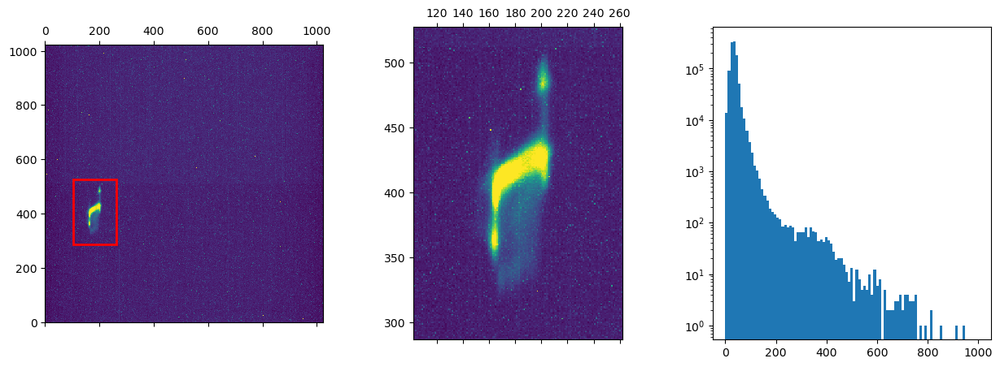

Showing complete shot #2 at time index 229:


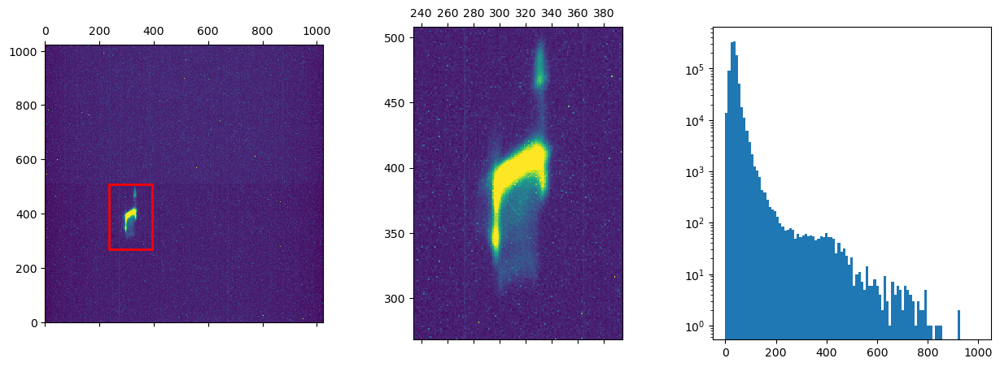

Showing complete shot #3 at time index 230:


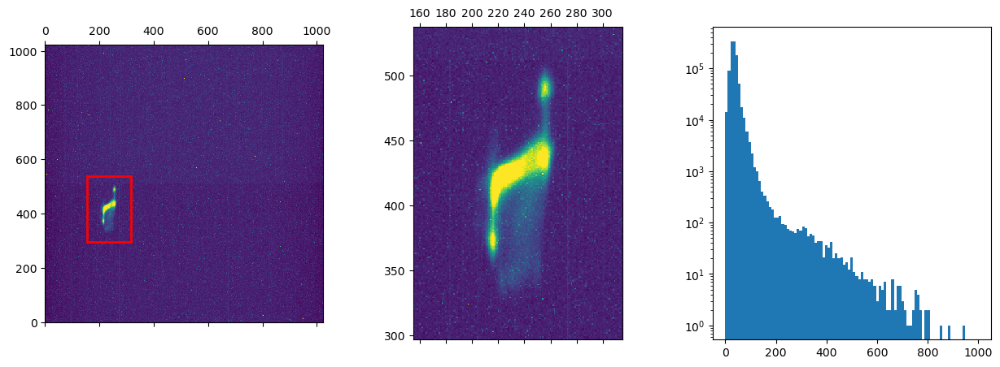

Showing complete shot #4 at time index 231:


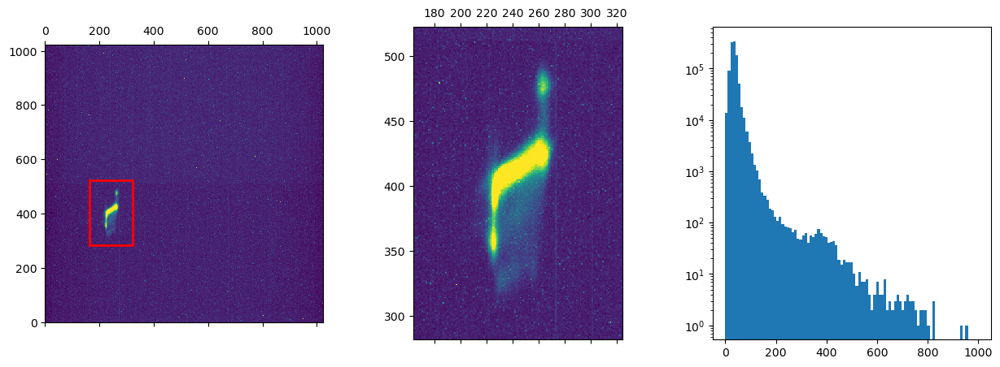

Showing complete shot #5 at time index 232:


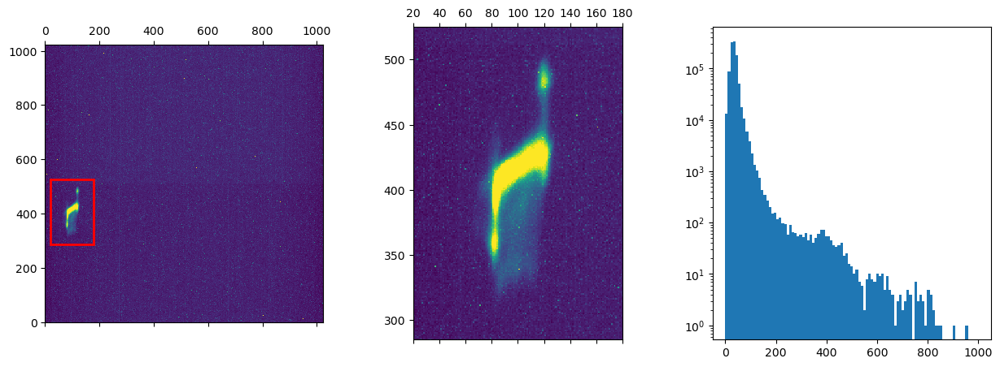

In [98]:
# Show a few shots

# params
n_shots_show = 5
fovs = Lx,Ly = 160,240

# loop
for idx,(i,j,evt) in enumerate(xproc.generate_complete_shots_iterator()):
    # continue?
    if idx>=n_shots_show:
        break
    print(f"Showing complete shot #{i+1} at time index {j}:")

    # Get shot and image
    xproc.set_current_event(evt)
    im = xproc._rawimage

    # Get CoM for zoom-in
    com = get_com_clean(im)

    # Plot
    fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(15,5))
    # full field
    ax1.matshow(im, vmin=0,vmax=350)
    ax1.invert_yaxis()
    # zoom-in
    ax2.matshow(im, vmin=0,vmax=350)
    ax2.set_xlim(get_plot_lims(com[1],Lx))
    ax2.set_ylim(get_plot_lims(com[0],Ly))
    #ax2.set_aspect('equal')   
    # zoom rectangle
    xy = (com[1]-Lx/2,com[0]-Ly/2)
    rect = Rectangle((xy),Lx,Ly,lw=2,edgecolor='r',facecolor='none')
    ax1.add_patch(rect)
    # histogram
    ax3.hist(im.ravel(),bins=np.linspace(0,1000,100))
    ax3.set_yscale('log')
    plt.show()

In [99]:
from scipy.ndimage import binary_dilation,binary_erosion

Showing complete shot #1 at time index 228:


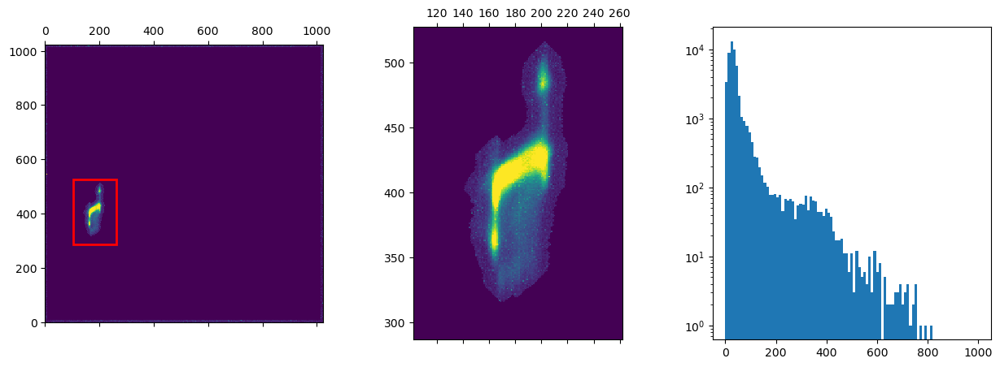

Showing complete shot #2 at time index 229:


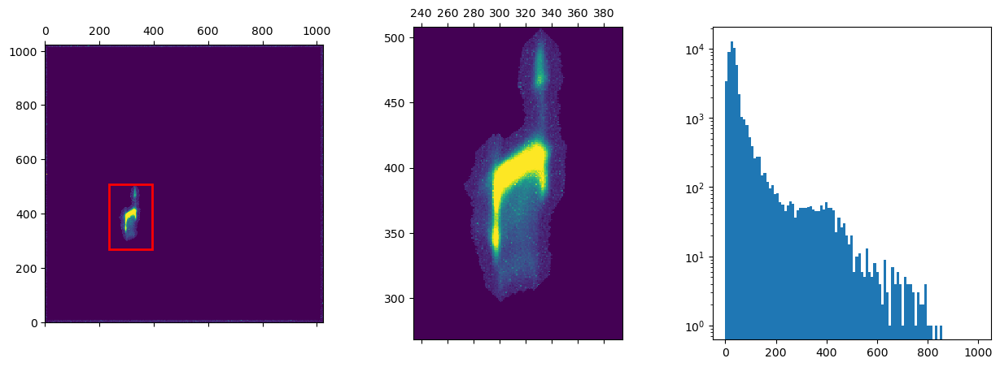

Showing complete shot #3 at time index 230:


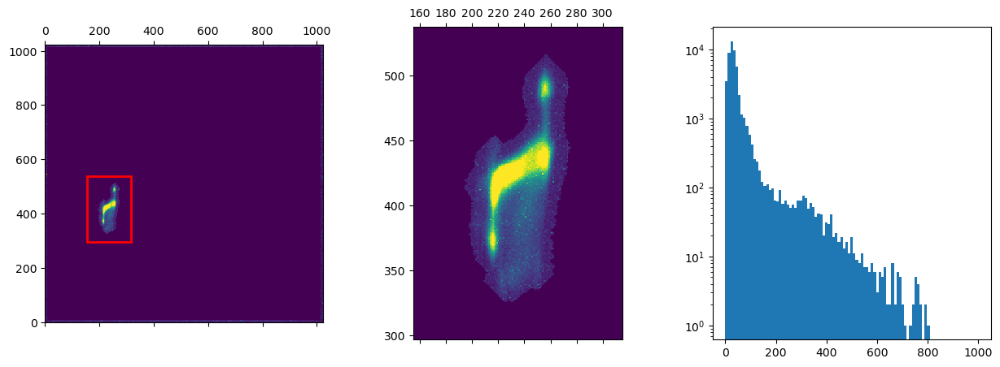

Showing complete shot #4 at time index 231:


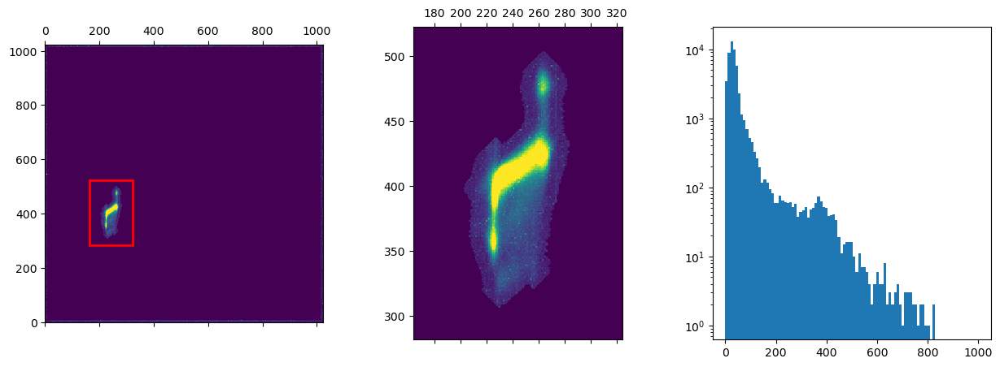

Showing complete shot #5 at time index 232:


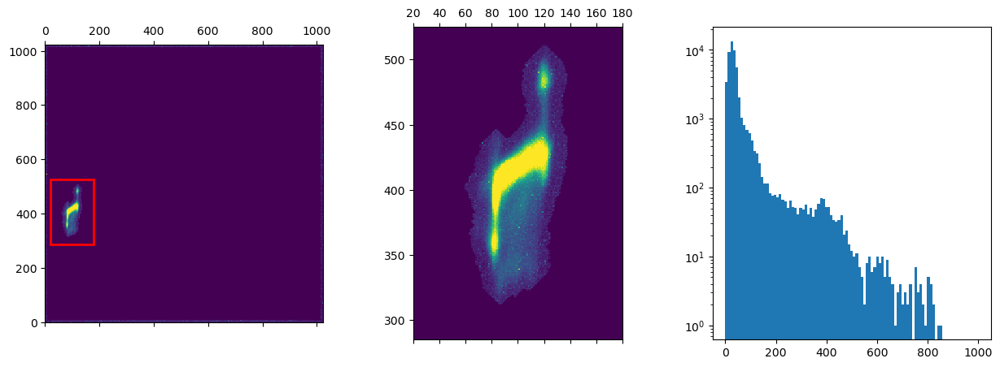

In [100]:
# Show a few shots, masking background

# params
n_shots_show = 5
fovs = Lx,Ly = 160,240

# loop
for idx,(i,j,evt) in enumerate(xproc.generate_complete_shots_iterator()):
    # continue?
    if idx>=n_shots_show:
        break
    print(f"Showing complete shot #{i+1} at time index {j}:")

    # Get shot and image
    xproc.set_current_event(evt)
    im = xproc._rawimage

    # Get CoM for zoom-in
    com,mask = get_com_clean(im,returnmask=True)
    mask = ~binary_erosion(mask,iterations=10)

    # Plot
    fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(15,5))
    # full field
    ax1.matshow(im*mask, vmin=0,vmax=350)
    ax1.invert_yaxis()
    # zoom-in
    ax2.matshow(im*mask, vmin=0,vmax=350)
    ax2.set_xlim(get_plot_lims(com[1],Lx))
    ax2.set_ylim(get_plot_lims(com[0],Ly))
    #ax2.set_aspect('equal')   
    # zoom rectangle
    xy = (com[1]-Lx/2,com[0]-Ly/2)
    rect = Rectangle((xy),Lx,Ly,lw=2,edgecolor='r',facecolor='none')
    ax1.add_patch(rect)
    # histogram
    ax3.hist(im[mask],bins=np.linspace(0,1000,100))
    ax3.set_yscale('log')
    plt.show()

Showing complete shot #1 at time index 228:


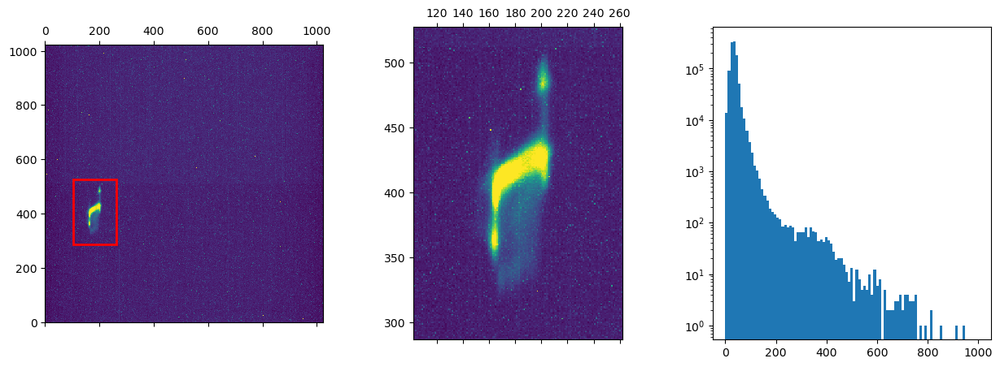

Showing complete shot #2 at time index 229:


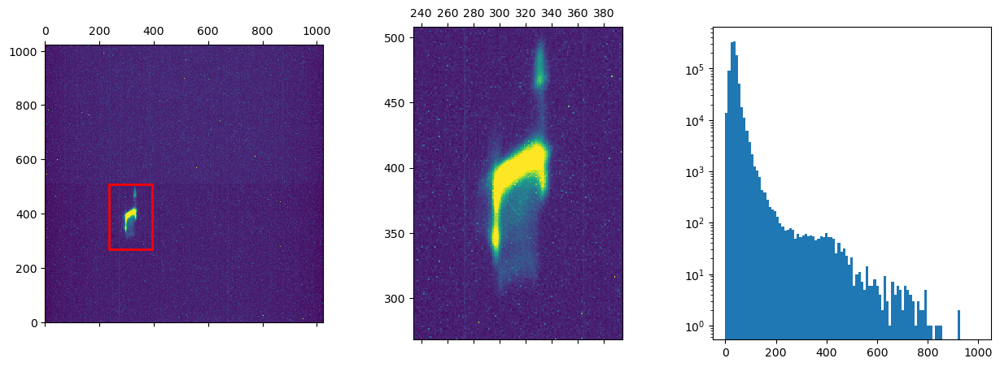

Showing complete shot #3 at time index 230:


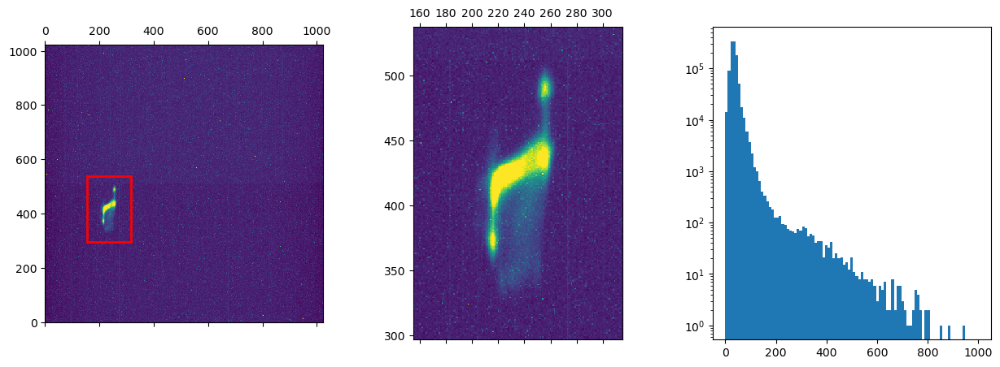

Showing complete shot #4 at time index 231:


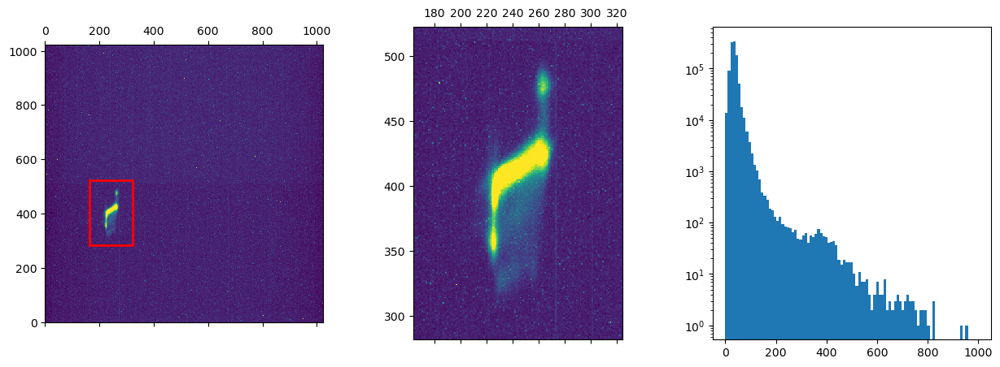

In [101]:
# Show a few shots, then continue where we left off with the same iterator

# params
n_shots_show = 2
fovs = Lx,Ly = 160,240

iterator = xproc.generate_complete_shots_iterator()

# loop
for idx,(i,j,evt) in enumerate(iterator):
    print(f"Showing complete shot #{i+1} at time index {j}:")

    # Get shot and image
    xproc.set_current_event(evt)
    im = xproc._rawimage

    # Get CoM for zoom-in
    com = get_com_clean(im)

    # Plot
    fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(15,5))
    # full field
    ax1.matshow(im, vmin=0,vmax=350)
    ax1.invert_yaxis()
    # zoom-in
    ax2.matshow(im, vmin=0,vmax=350)
    ax2.set_xlim(get_plot_lims(com[1],Lx))
    ax2.set_ylim(get_plot_lims(com[0],Ly))
    #ax2.set_aspect('equal')   
    # zoom rectangle
    xy = (com[1]-Lx/2,com[0]-Ly/2)
    rect = Rectangle((xy),Lx,Ly,lw=2,edgecolor='r',facecolor='none')
    ax1.add_patch(rect)
    # histogram
    ax3.hist(im.ravel(),bins=np.linspace(0,1000,100))
    ax3.set_yscale('log')
    plt.show()

    # continue?
    if idx>=n_shots_show-1:
        break


for idx,(i,j,evt) in enumerate(iterator):
    print(f"Showing complete shot #{i+1} at time index {j}:")

    # Get shot and image
    xproc.set_current_event(evt)
    im = xproc._rawimage

    # Get CoM for zoom-in
    com = get_com_clean(im)

    # Plot
    fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(15,5))
    # full field
    ax1.matshow(im, vmin=0,vmax=350)
    ax1.invert_yaxis()
    # zoom-in
    ax2.matshow(im, vmin=0,vmax=350)
    ax2.set_xlim(get_plot_lims(com[1],Lx))
    ax2.set_ylim(get_plot_lims(com[0],Ly))
    #ax2.set_aspect('equal')   
    # zoom rectangle
    xy = (com[1]-Lx/2,com[0]-Ly/2)
    rect = Rectangle((xy),Lx,Ly,lw=2,edgecolor='r',facecolor='none')
    ax1.add_patch(rect)
    # histogram
    ax3.hist(im.ravel(),bins=np.linspace(0,1000,100))
    ax3.set_yscale('log')
    plt.show()

    # continue?
    if idx>=n_shots_show-1:
        break

In [108]:
# xproc._set_iteration_type('frame')
# xproc.reset_shot_iterator()

Showing good shot #1 at time index 228:


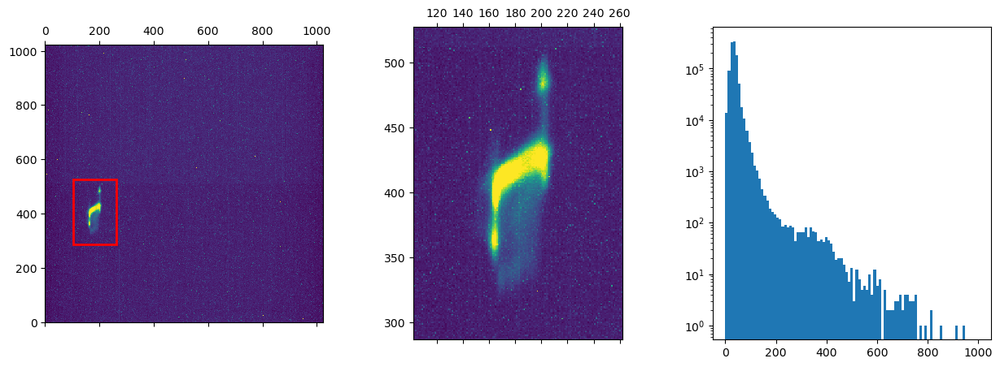

Showing good shot #2 at time index 229:


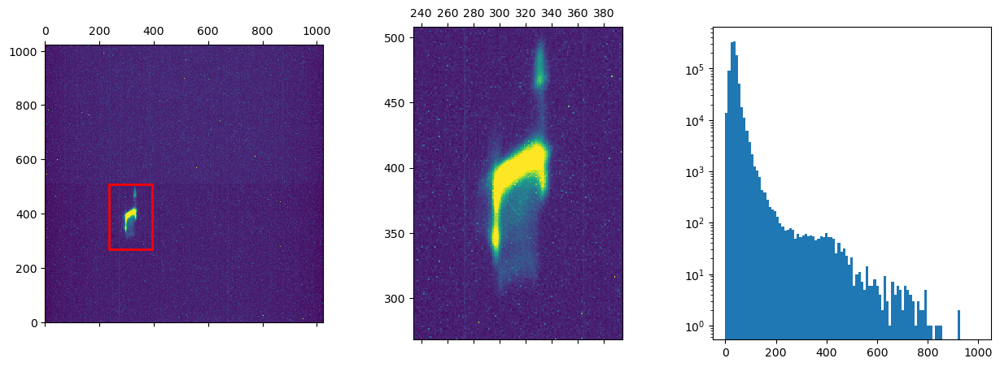

Showing good shot #3 at time index 230:


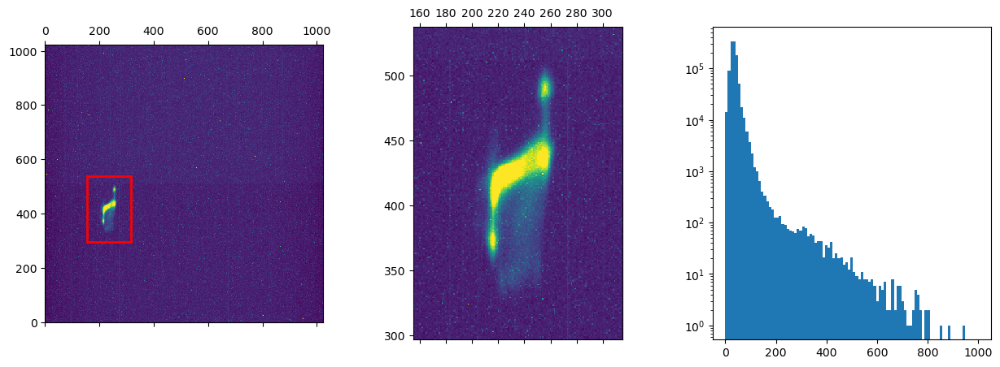

Showing good shot #4 at time index 231:


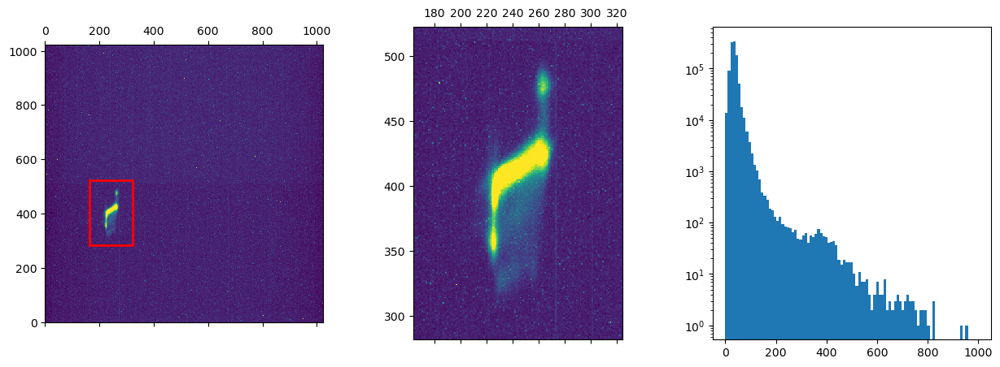

In [107]:
# Show a few shots with default iterator (starts at beginning, complete data not guaranteed)

# params
n_shots_show = 2
fovs = Lx,Ly = 160,240

# loop
for idx,(i,j,evt) in enumerate(xproc.shot_iterator):
    print(f"Showing good shot #{i+1} at time index {j}:")

    # Get shot and image
    xproc.set_current_event(evt)
    im = xproc._rawimage

    try:
        # Get CoM for zoom-in
        com = get_com_clean(im)
    
        # Plot
        fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(15,5))
        # full field
        ax1.matshow(im, vmin=0,vmax=350)
        ax1.invert_yaxis()
        # zoom-in
        ax2.matshow(im, vmin=0,vmax=350)
        ax2.set_xlim(get_plot_lims(com[1],Lx))
        ax2.set_ylim(get_plot_lims(com[0],Ly))
        #ax2.set_aspect('equal')   
        # zoom rectangle
        xy = (com[1]-Lx/2,com[0]-Ly/2)
        rect = Rectangle((xy),Lx,Ly,lw=2,edgecolor='r',facecolor='none')
        ax1.add_patch(rect)
        # histogram
        ax3.hist(im.ravel(),bins=np.linspace(0,1000,100))
        ax3.set_yscale('log')
        plt.show()
    except TypeError:
        assert(im is None)
        print(f"Shot {i+1} is missing XTCAV camera data")

    # continue?
    if idx>=n_shots_show-1:
        break


for idx,(i,j,evt) in enumerate(xproc.shot_iterator):
    print(f"Showing good shot #{i+1} at time index {j}:")

    # Get shot and image
    xproc.set_current_event(evt)
    im = xproc._rawimage

    try:
        # Get CoM for zoom-in
        com = get_com_clean(im)
    
        # Plot
        fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(15,5))
        # full field
        ax1.matshow(im, vmin=0,vmax=350)
        ax1.invert_yaxis()
        # zoom-in
        ax2.matshow(im, vmin=0,vmax=350)
        ax2.set_xlim(get_plot_lims(com[1],Lx))
        ax2.set_ylim(get_plot_lims(com[0],Ly))
        #ax2.set_aspect('equal')   
        # zoom rectangle
        xy = (com[1]-Lx/2,com[0]-Ly/2)
        rect = Rectangle((xy),Lx,Ly,lw=2,edgecolor='r',facecolor='none')
        ax1.add_patch(rect)
        # histogram
        ax3.hist(im.ravel(),bins=np.linspace(0,1000,100))
        ax3.set_yscale('log')
        plt.show()
    except TypeError:
        assert(im is None)
        print(f"Shot {i+1} is missing XTCAV camera data")

    # continue?
    if idx>=n_shots_show-1:
        break

## Test without pre-indexing

In [130]:
dataSource=psana.DataSource("exp=cxil1037623:run=%d:idx"%runnum)
xproc = XTCAVProcessor(dataSource, iteration='all')

Setting data source types...:   0%|          | 0/41024 [00:00<?, ?it/s]

Data source types successfully set.
Electron beam source type is <class 'psana.Bld.BldDataEBeamV7'>
Gas detector source type is <class 'psana.Bld.BldDataFEEGasDetEnergyV1'>


In [131]:
# Show a few shots with default iterator 
# Skip events without XTCAV camera data and print a message saying so

# params
n_shots_show = 2
fovs = Lx,Ly = 160,240

# loop
for idx,(i,j,evt) in enumerate(xproc.shot_iterator):
    print(f"Showing good shot #{i+1} at time index {j}:")

    # Get shot and image
    xproc.set_current_event(evt)
    im = xproc._rawimage

    try:
        # Get CoM for zoom-in
        com = get_com_clean(im)
    
        # Plot
        fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(15,5))
        # full field
        ax1.matshow(im, vmin=0,vmax=350)
        ax1.invert_yaxis()
        # zoom-in
        ax2.matshow(im, vmin=0,vmax=350)
        ax2.set_xlim(get_plot_lims(com[1],Lx))
        ax2.set_ylim(get_plot_lims(com[0],Ly))
        #ax2.set_aspect('equal')   
        # zoom rectangle
        xy = (com[1]-Lx/2,com[0]-Ly/2)
        rect = Rectangle((xy),Lx,Ly,lw=2,edgecolor='r',facecolor='none')
        ax1.add_patch(rect)
        # histogram
        ax3.hist(im.ravel(),bins=np.linspace(0,1000,100))
        ax3.set_yscale('log')
        plt.show()
    except TypeError:
        assert(im is None)
        print(f"Shot {i+1} is missing XTCAV camera data")

    # continue?
    if idx>=n_shots_show-1:
        break


for idx,(i,j,evt) in enumerate(xproc.shot_iterator):
    print(f"Showing good shot #{i+1} at time index {j}:")

    # Get shot and image
    xproc.set_current_event(evt)
    im = xproc._rawimage

    try:
        # Get CoM for zoom-in
        com = get_com_clean(im)
    
        # Plot
        fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(15,5))
        # full field
        ax1.matshow(im, vmin=0,vmax=350)
        ax1.invert_yaxis()
        # zoom-in
        ax2.matshow(im, vmin=0,vmax=350)
        ax2.set_xlim(get_plot_lims(com[1],Lx))
        ax2.set_ylim(get_plot_lims(com[0],Ly))
        #ax2.set_aspect('equal')   
        # zoom rectangle
        xy = (com[1]-Lx/2,com[0]-Ly/2)
        rect = Rectangle((xy),Lx,Ly,lw=2,edgecolor='r',facecolor='none')
        ax1.add_patch(rect)
        # histogram
        ax3.hist(im.ravel(),bins=np.linspace(0,1000,100))
        ax3.set_yscale('log')
        plt.show()
    except TypeError:
        assert(im is None)
        print(f"Shot {i+1} is missing XTCAV camera data")

    # continue?
    if idx>=n_shots_show-1:
        break

Showing good shot #1 at time index 0:
Shot 1 is missing XTCAV camera data
Showing good shot #2 at time index 1:
Shot 2 is missing XTCAV camera data
Showing good shot #3 at time index 2:
Shot 3 is missing XTCAV camera data
Showing good shot #4 at time index 3:
Shot 4 is missing XTCAV camera data


Showing good shot #5 at time index 4:
Shot 5 is missing XTCAV camera data
Showing good shot #6 at time index 5:
Shot 6 is missing XTCAV camera data
Showing good shot #7 at time index 6:
Shot 7 is missing XTCAV camera data
Showing good shot #8 at time index 7:
Shot 8 is missing XTCAV camera data
Showing good shot #9 at time index 8:
Shot 9 is missing XTCAV camera data
Showing good shot #10 at time index 9:
Shot 10 is missing XTCAV camera data
Showing good shot #11 at time index 10:
Shot 11 is missing XTCAV camera data
Showing good shot #12 at time index 11:
Shot 12 is missing XTCAV camera data
Showing good shot #13 at time index 12:
Shot 13 is missing XTCAV camera data
Showing good shot #14 at time index 13:
Shot 14 is missing XTCAV camera data
Showing good shot #15 at time index 14:
Shot 15 is missing XTCAV camera data
Showing good shot #16 at time index 15:
Shot 16 is missing XTCAV camera data
Showing good shot #17 at time index 16:
Shot 17 is missing XTCAV camera data
Showing good sh

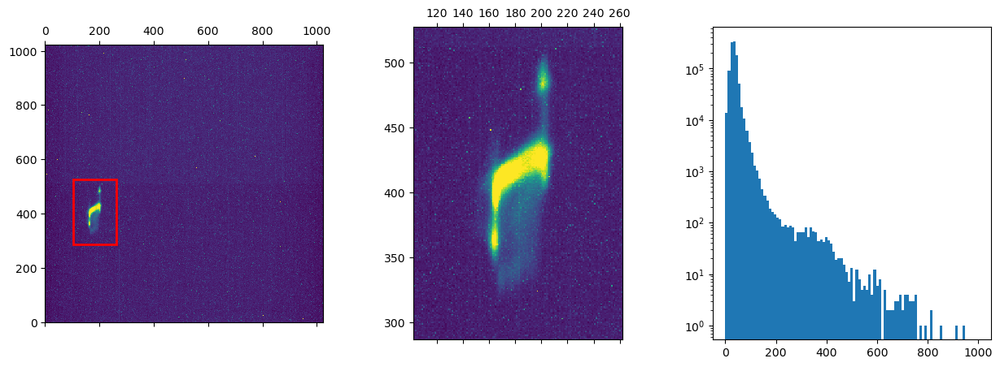

Showing good shot #230 at time index 229:


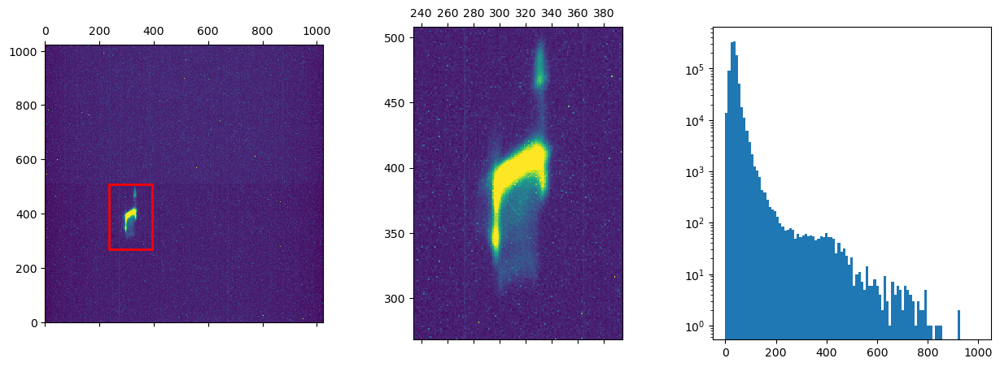

In [132]:
# Show a few shots with default iterator
# Skip events without XTCAV camera data and print a message saying so
# Continue until good (with a frame) shots are found

# params
n_shots_show = 2
fovs = Lx,Ly = 160,240

# loop
jdx = 0
for idx,(i,j,evt) in enumerate(xproc.shot_iterator):
    print(f"Showing good shot #{i+1} at time index {j}:")

    # Get shot and image
    xproc.set_current_event(evt)
    im = xproc._rawimage

    try:
        # Get CoM for zoom-in
        com = get_com_clean(im)
    
        # Plot
        fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(15,5))
        # full field
        ax1.matshow(im, vmin=0,vmax=350)
        ax1.invert_yaxis()
        # zoom-in
        ax2.matshow(im, vmin=0,vmax=350)
        ax2.set_xlim(get_plot_lims(com[1],Lx))
        ax2.set_ylim(get_plot_lims(com[0],Ly))
        #ax2.set_aspect('equal')   
        # zoom rectangle
        xy = (com[1]-Lx/2,com[0]-Ly/2)
        rect = Rectangle((xy),Lx,Ly,lw=2,edgecolor='r',facecolor='none')
        ax1.add_patch(rect)
        # histogram
        ax3.hist(im.ravel(),bins=np.linspace(0,1000,100))
        ax3.set_yscale('log')
        plt.show()

        # increment jdx
        jdx += 1
        
    except TypeError:
        assert(im is None)
        print(f"Shot {i+1} is missing XTCAV camera data")

    # continue?
    if jdx>=n_shots_show:
        break

In [133]:
# Now with the default iterator ('good')

dataSource=psana.DataSource("exp=cxil1037623:run=%d:idx"%runnum)
xproc = XTCAVProcessor(dataSource)

Setting data source types...:   0%|          | 0/41024 [00:00<?, ?it/s]

Data source types successfully set.
Electron beam source type is <class 'psana.Bld.BldDataEBeamV7'>
Gas detector source type is <class 'psana.Bld.BldDataFEEGasDetEnergyV1'>


Showing good shot #1 at time index 228:


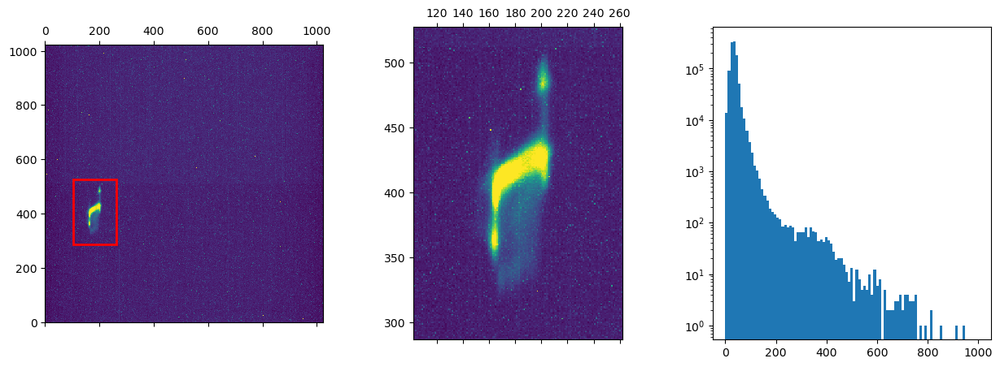

Showing good shot #2 at time index 229:


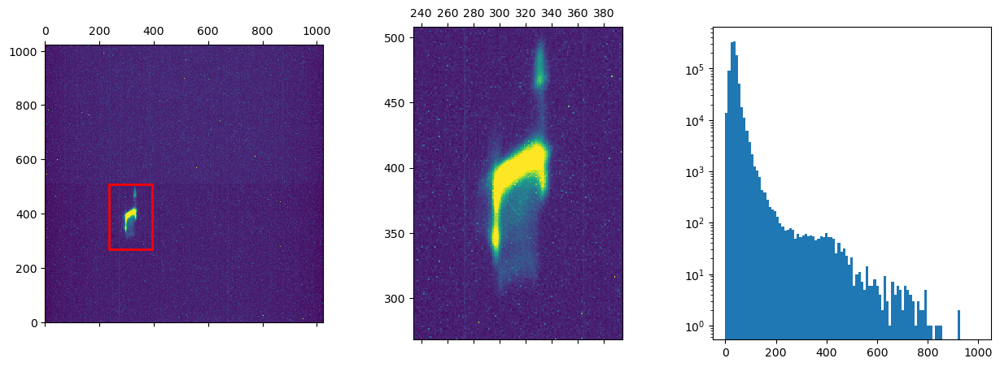

Showing good shot #3 at time index 230:


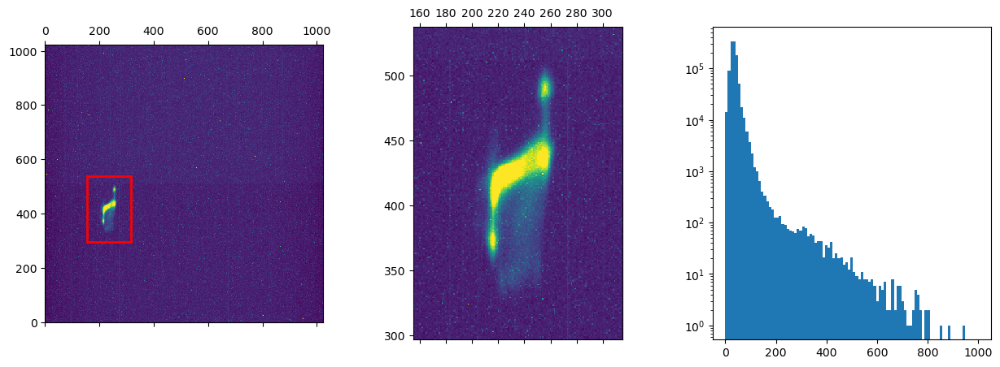

Showing good shot #4 at time index 231:


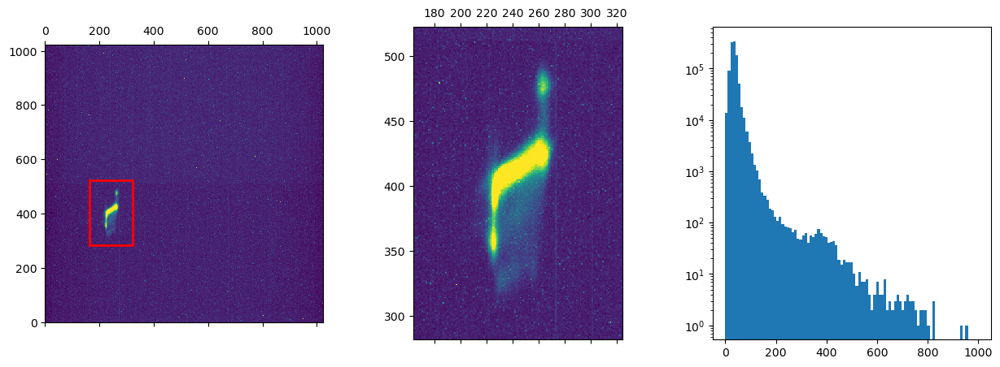

In [134]:
# Show a few shots with default iterator 
# Skip events without XTCAV camera data and print a message saying so

# params
n_shots_show = 2
fovs = Lx,Ly = 160,240

# loop
for idx,(i,j,evt) in enumerate(xproc.shot_iterator):
    print(f"Showing good shot #{i+1} at time index {j}:")

    # Get shot and image
    xproc.set_current_event(evt)
    im = xproc._rawimage

    try:
        # Get CoM for zoom-in
        com = get_com_clean(im)
    
        # Plot
        fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(15,5))
        # full field
        ax1.matshow(im, vmin=0,vmax=350)
        ax1.invert_yaxis()
        # zoom-in
        ax2.matshow(im, vmin=0,vmax=350)
        ax2.set_xlim(get_plot_lims(com[1],Lx))
        ax2.set_ylim(get_plot_lims(com[0],Ly))
        #ax2.set_aspect('equal')   
        # zoom rectangle
        xy = (com[1]-Lx/2,com[0]-Ly/2)
        rect = Rectangle((xy),Lx,Ly,lw=2,edgecolor='r',facecolor='none')
        ax1.add_patch(rect)
        # histogram
        ax3.hist(im.ravel(),bins=np.linspace(0,1000,100))
        ax3.set_yscale('log')
        plt.show()
    except TypeError:
        assert(im is None)
        print(f"Shot {i+1} is missing XTCAV camera data")

    # continue?
    if idx>=n_shots_show-1:
        break


for idx,(i,j,evt) in enumerate(xproc.shot_iterator):
    print(f"Showing good shot #{i+1} at time index {j}:")

    # Get shot and image
    xproc.set_current_event(evt)
    im = xproc._rawimage

    try:
        # Get CoM for zoom-in
        com = get_com_clean(im)
    
        # Plot
        fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(15,5))
        # full field
        ax1.matshow(im, vmin=0,vmax=350)
        ax1.invert_yaxis()
        # zoom-in
        ax2.matshow(im, vmin=0,vmax=350)
        ax2.set_xlim(get_plot_lims(com[1],Lx))
        ax2.set_ylim(get_plot_lims(com[0],Ly))
        #ax2.set_aspect('equal')   
        # zoom rectangle
        xy = (com[1]-Lx/2,com[0]-Ly/2)
        rect = Rectangle((xy),Lx,Ly,lw=2,edgecolor='r',facecolor='none')
        ax1.add_patch(rect)
        # histogram
        ax3.hist(im.ravel(),bins=np.linspace(0,1000,100))
        ax3.set_yscale('log')
        plt.show()
    except TypeError:
        assert(im is None)
        print(f"Shot {i+1} is missing XTCAV camera data")

    # continue?
    if idx>=n_shots_show-1:
        break

### Test resetting the iterator

In [135]:
# Loop to the end
# There are 41024 shots.

for idx,(i,j,evt) in enumerate(xproc.shot_iterator):
    if j%1000==0:
        print(f"Iterated to shot {j}.  Continuing...")
    pass
print('Done.')

Iterated to shot 1000.  Continuing...
Iterated to shot 2000.  Continuing...
Iterated to shot 3000.  Continuing...
Iterated to shot 4000.  Continuing...
Iterated to shot 5000.  Continuing...
Iterated to shot 6000.  Continuing...
Iterated to shot 7000.  Continuing...
Iterated to shot 8000.  Continuing...
Iterated to shot 9000.  Continuing...
Iterated to shot 10000.  Continuing...
Iterated to shot 11000.  Continuing...
Iterated to shot 12000.  Continuing...
Iterated to shot 13000.  Continuing...
Iterated to shot 14000.  Continuing...
Iterated to shot 15000.  Continuing...
Iterated to shot 16000.  Continuing...
Iterated to shot 17000.  Continuing...
Iterated to shot 18000.  Continuing...
Iterated to shot 19000.  Continuing...
Iterated to shot 20000.  Continuing...
Iterated to shot 21000.  Continuing...
Iterated to shot 22000.  Continuing...
Iterated to shot 23000.  Continuing...
Iterated to shot 24000.  Continuing...
Iterated to shot 25000.  Continuing...
Iterated to shot 26000.  Continuin

In [137]:
# Try iterating.  Should fail - iterator has not been reset.

for idx,(i,j,evt) in enumerate(xproc.shot_iterator):
    print(f"Iterated to shot {j}.  Continuing...")
    if j>=5:
        break
    pass
print('Done.')

Done.


In [139]:
# Now reset the iterator and try again.

xproc.reset_shot_iterator()

for idx,(i,j,evt) in enumerate(xproc.shot_iterator):
    print(f"Iterated to shot {j}.  Continuing...")
    if i>=5:
        break
    pass
print('Done.')

Iterated to shot 228.  Continuing...
Iterated to shot 229.  Continuing...
Iterated to shot 230.  Continuing...
Iterated to shot 231.  Continuing...
Iterated to shot 232.  Continuing...
Iterated to shot 233.  Continuing...
Done.


In [141]:
# Now try resetting to a different iterator type.

xproc._set_iteration_type('all')
xproc.reset_shot_iterator()

for idx,(i,j,evt) in enumerate(xproc.shot_iterator):
    print(f"Iterated to shot {j}.  Continuing...")
    if i>=5:
        break
    pass
print('Done.')

Iterated to shot 0.  Continuing...
Iterated to shot 1.  Continuing...
Iterated to shot 2.  Continuing...
Iterated to shot 3.  Continuing...
Iterated to shot 4.  Continuing...
Iterated to shot 5.  Continuing...
Done.


In [142]:
xproc._set_iteration_type('frame')
xproc.reset_shot_iterator()

for idx,(i,j,evt) in enumerate(xproc.shot_iterator):
    print(f"Iterated to shot {j}.  Continuing...")
    if i>=5:
        break
    pass
print('Done.')

Iterated to shot 228.  Continuing...
Iterated to shot 229.  Continuing...
Iterated to shot 230.  Continuing...
Iterated to shot 231.  Continuing...
Iterated to shot 232.  Continuing...
Iterated to shot 233.  Continuing...
Done.
